<a href="https://colab.research.google.com/github/SoheliPaul/Deep-Learning/blob/main/2348561_DL_Lab7.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Importing Necessary Libraries

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os
import cv2
import random
from keras.applications.resnet50 import ResNet50
import tensorflow as tf
import scipy as sp
from keras import backend as K
import keras.applications.inception_v3 as inception_v3
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential, Model
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, BatchNormalization, Dropout
from sklearn.metrics import confusion_matrix, classification_report

# 1.Data Preprocessing:
- Standardize the sizes of images in Dataset A and Dataset B, normalize pixel values, and apply augmentation techniques.
- Incorporate additional preprocessing steps for Dataset B, tailored to tuberculosis detection.

In [ ]:
datasetA_train_path = 'F:/Lab7 Dataset/chest_xray/train'
datasetA_test_path = 'F:/Lab7 Dataset/chest_xray/test'
train = ImageDataGenerator(rescale=1/255,shear_range=0.2,zoom_range=0.2,horizontal_flip=True,brightness_range=[1.0,2.0],rotation_range=20,validation_split=0.2)
train_generatorA= train.flow_from_directory(datasetA_train_path,target_size=(180, 180),batch_size=32,class_mode='categorical',subset='training')
test_generatorA= train.flow_from_directory(datasetA_test_path,target_size=(180,180),batch_size=32,class_mode = 'categorical',subset='validation',shuffle=True)
print("Class indices:")
print(train_generatorA.class_indices)

Found 4173 images belonging to 2 classes.
Found 124 images belonging to 2 classes.
Class indices:
{'NORMAL': 0, 'PNEUMONIA': 1}


In [ ]:
datasetB_path = 'F:/Lab7 Dataset/TB_Chest_Radiography_Database'
train = ImageDataGenerator(rescale=1/255,shear_range=0.2,zoom_range=0.2,horizontal_flip=True,brightness_range=[1.0,2.0],rotation_range=20,validation_split=0.2)
train_generatorB = train.flow_from_directory(datasetB_path,target_size=(180, 180),batch_size=32,class_mode='categorical',subset='training')
test_generatorB = train.flow_from_directory(datasetB_path,target_size=(180,180),batch_size=32,class_mode = 'categorical',subset='validation',shuffle=True)
print("Class indices:")
print(train_generatorB.class_indices)

Found 3360 images belonging to 2 classes.
Found 840 images belonging to 2 classes.
Class indices:
{'Normal': 0, 'Tuberculosis': 1}


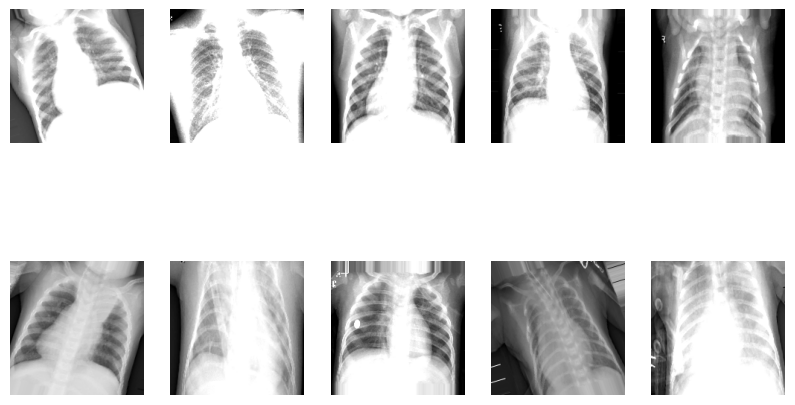

In [ ]:
#Visualize some of the augmented images from Dataset A
x_batch, y_batch = next(train_generatorA)
fig, axs = plt.subplots(2, 5,figsize=(10,6))
for i, ax in enumerate(axs.flatten()):
    ax.imshow(x_batch[i])
    ax.axis('off')
plt.show()

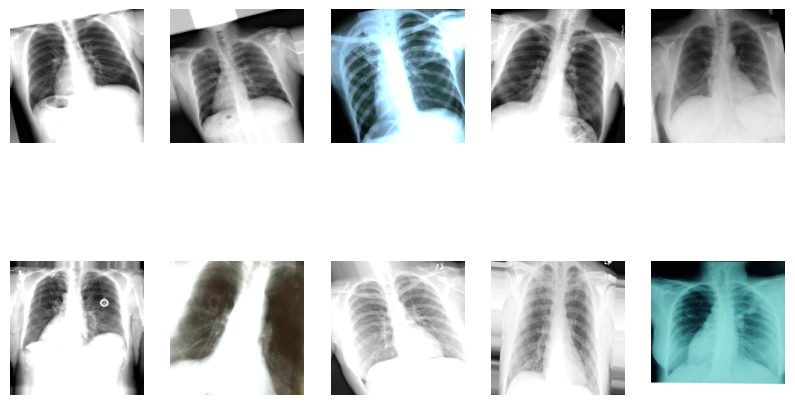

In [ ]:
#Visualize some of the augmented images from Dataset B
x_batch, y_batch = next(train_generatorB)
fig, axs = plt.subplots(2, 5,figsize=(10,6))
for i, ax in enumerate(axs.flatten()):
    ax.imshow(x_batch[i])
    ax.axis('off')
plt.show()

# 2. ResNet and Custom CNN Architecture Implementation:
# ResNet:
- Implement a ResNet architecture, focusing on residual blocks with skip connections.
- Include batch normalization after each convolutional layer to stabilize and accelerate training.
- Incorporate dropout layers to prevent overfitting.

For Dataset A

In [ ]:
model_resnet = ResNet50(input_shape=(180,180,3), include_top=False, weights='imagenet')

In [ ]:
for layer in model_resnet.layers:
   layer.trainable=False
   model_resnet.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 180, 180, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 186, 186, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 90, 90, 64)           9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 90, 90, 64)           256       ['conv1_conv[0][0]']          
 on)                                                                                       

In [ ]:
modelA = Sequential()
modelA.add(model_resnet)
modelA.add(Flatten())
modelA.add(Dense(512, activation='relu'))
modelA.add(Dropout(0.5))
modelA.add(Dense(2, activation='sigmoid'))
modelA.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 6, 6, 2048)        23587712  
                                                                 
 flatten (Flatten)           (None, 73728)             0         
                                                                 
 dense (Dense)               (None, 512)               37749248  
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                                 
 dense_1 (Dense)             (None, 2)                 1026      
                                                                 
Total params: 61337986 (233.99 MB)
Trainable params: 37750274 (144.01 MB)
Non-trainable params: 23587712 (89.98 MB)
_________________________________________________________________


For Dataset B

In [ ]:
for layer in model_resnet.layers:
   layer.trainable=False
   model_resnet.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 180, 180, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 186, 186, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 90, 90, 64)           9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 90, 90, 64)           256       ['conv1_conv[0][0]']          
 on)                                                                                       

In [ ]:
modelAB = Sequential()
modelAB.add(model_resnet)
modelAB.add(Flatten())
modelAB.add(Dense(512, activation='relu'))
modelAB.add(Dropout(0.5))
modelAB.add(Dense(2, activation='sigmoid'))
modelAB.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 6, 6, 2048)        23587712  
                                                                 
 flatten_1 (Flatten)         (None, 73728)             0         
                                                                 
 dense_2 (Dense)             (None, 512)               37749248  
                                                                 
 dropout_1 (Dropout)         (None, 512)               0         
                                                                 
 dense_3 (Dense)             (None, 2)                 1026      
                                                                 
Total params: 61337986 (233.99 MB)
Trainable params: 37750274 (144.01 MB)
Non-trainable params: 23587712 (89.98 MB)
_________________________________________________________________


# Custom CNN:
- Design a custom CNN architecture for chest X-ray classification.
- Integrate convolutional layers, max-pooling layers, and fully connected layers.
- Utilize batch normalization after convolutional layers and dropout layers to enhance model generalization and prevent overfitting.

For Dataset A

In [ ]:
modelB = Sequential()
modelB.add(Conv2D(32, (3, 3), activation='relu', input_shape=(180, 180, 3)))
modelB.add(MaxPooling2D((2, 2)))
modelB.add(Conv2D(64, (3, 3), activation='relu'))
modelB.add(MaxPooling2D((2, 2)))
modelB.add(Conv2D(128, (3, 3), activation='relu'))
modelB.add(MaxPooling2D((2, 2)))
modelB.add(Conv2D(256, (3, 3), activation='relu'))
modelB.add(MaxPooling2D((2, 2)))
modelB.add(Flatten())
modelB.add(Dense(512, activation='relu'))
modelB.add(Dropout(0.5))
modelB.add(Dense(2, activation='sigmoid'))
modelB.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 178, 178, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 89, 89, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 87, 87, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 43, 43, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 41, 41, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 20, 20, 128)      

For Dataset B

In [ ]:
modelBA = Sequential()
modelBA.add(Conv2D(32, (3, 3), activation='relu', input_shape=(180, 180, 3)))
modelBA.add(MaxPooling2D((2, 2)))
modelBA.add(Conv2D(64, (3, 3), activation='relu'))
modelBA.add(MaxPooling2D((2, 2)))
modelBA.add(Conv2D(128, (3, 3), activation='relu'))
modelBA.add(MaxPooling2D((2, 2)))
modelBA.add(Conv2D(256, (3, 3), activation='relu'))
modelBA.add(MaxPooling2D((2, 2)))
modelBA.add(Flatten())
modelBA.add(Dense(512, activation='relu'))
modelBA.add(Dropout(0.5))
modelBA.add(Dense(2, activation='sigmoid'))
modelBA.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 178, 178, 32)      896       
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 89, 89, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_5 (Conv2D)           (None, 87, 87, 64)        18496     
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 43, 43, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_6 (Conv2D)           (None, 41, 41, 128)       73856     
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 20, 20, 128)      

# 3. Training:
- Split both datasets into training, validation, and test sets.
- Configure training pipelines for ResNet and the custom CNN, utilizing appropriate optimizers and learning rate schedules.
- Train models with iterative forward and backward passes, updating parameters to minimize loss.

ResNet Architecture

Dataset A

In [ ]:
modelA.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
historyA=modelA.fit(train_generatorA, epochs=5, validation_data=test_generatorA)


Epoch 1/5


131/131 [==============================] - 378s 3s/step - loss: 1.4059 - accuracy: 0.7168 - val_loss: 0.8497 - val_accuracy: 0.6290
Epoch 2/5
131/131 [==============================] - 361s 3s/step - loss: 0.5516 - accuracy: 0.7412 - val_loss: 0.6254 - val_accuracy: 0.6290
Epoch 3/5
131/131 [==============================] - 359s 3s/step - loss: 0.6078 - accuracy: 0.7429 - val_loss: 0.6643 - val_accuracy: 0.6290
Epoch 4/5
131/131 [==============================] - 359s 3s/step - loss: 0.6085 - accuracy: 0.7429 - val_loss: 0.6597 - val_accuracy: 0.6290
Epoch 5/5
131/131 [==============================] - 376s 3s/step - loss: 0.5949 - accuracy: 0.7429 - val_loss: 0.6647 - val_accuracy: 0.6290


Dataset B

In [ ]:
modelAB.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
historyAB=modelAB.fit(train_generatorB, epochs=5, validation_data=test_generatorB)

Epoch 1/5
105/105 [==============================] - 358s 3s/step - loss: 1.1699 - accuracy: 0.7973 - val_loss: 0.4588 - val_accuracy: 0.8333
Epoch 2/5
105/105 [==============================] - 368s 4s/step - loss: 0.4873 - accuracy: 0.8313 - val_loss: 0.4398 - val_accuracy: 0.8333
Epoch 3/5
105/105 [==============================] - 364s 3s/step - loss: 0.4913 - accuracy: 0.8310 - val_loss: 0.4804 - val_accuracy: 0.8333
Epoch 4/5
105/105 [==============================] - 351s 3s/step - loss: 0.4693 - accuracy: 0.8304 - val_loss: 0.4404 - val_accuracy: 0.8333
Epoch 5/5
105/105 [==============================] - 372s 4s/step - loss: 0.4518 - accuracy: 0.8321 - val_loss: 0.4341 - val_accuracy: 0.8333


Custom CNN

Dataset A

In [ ]:
modelB.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
historyB=modelB.fit(train_generatorA, epochs=5, validation_data=test_generatorA)

Epoch 1/5
131/131 [==============================] - 269s 2s/step - loss: 0.5156 - accuracy: 0.7762 - val_loss: 0.3835 - val_accuracy: 0.7823
Epoch 2/5
131/131 [==============================] - 268s 2s/step - loss: 0.3048 - accuracy: 0.8708 - val_loss: 0.5039 - val_accuracy: 0.7016
Epoch 3/5
131/131 [==============================] - 256s 2s/step - loss: 0.2625 - accuracy: 0.8912 - val_loss: 0.3767 - val_accuracy: 0.7581
Epoch 4/5
131/131 [==============================] - 251s 2s/step - loss: 0.2392 - accuracy: 0.9051 - val_loss: 0.5547 - val_accuracy: 0.7177
Epoch 5/5
131/131 [==============================] - 223s 2s/step - loss: 0.2464 - accuracy: 0.8989 - val_loss: 0.5306 - val_accuracy: 0.7016


Dataset B

In [ ]:
modelBA.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
historyBA=modelBA.fit(train_generatorB, epochs=5, validation_data=test_generatorB)

Epoch 1/5
105/105 [==============================] - 200s 2s/step - loss: 0.3942 - accuracy: 0.8571 - val_loss: 0.4204 - val_accuracy: 0.8571
Epoch 2/5
105/105 [==============================] - 216s 2s/step - loss: 0.2977 - accuracy: 0.8836 - val_loss: 0.3503 - val_accuracy: 0.8440
Epoch 3/5
105/105 [==============================] - 174s 2s/step - loss: 0.2724 - accuracy: 0.8985 - val_loss: 0.2899 - val_accuracy: 0.8476
Epoch 4/5
105/105 [==============================] - 175s 2s/step - loss: 0.2452 - accuracy: 0.9092 - val_loss: 0.3248 - val_accuracy: 0.8607
Epoch 5/5
105/105 [==============================] - 173s 2s/step - loss: 0.1927 - accuracy: 0.9312 - val_loss: 0.2640 - val_accuracy: 0.8655


# 4.Evaluation:

- Evaluate the trained ResNet and custom CNN models on the test sets of Dataset A and Dataset B.
- Compute evaluation metrics such as accuracy, precision, recall, and F1-score to assess performance.
- Visualize predictions and analyze error patterns.

ResNet Architecture

Dataset A

In [ ]:
test_loss_A, test_accuracy_A = modelA.evaluate(test_generatorA)
print("Test Accuracy:", test_accuracy_A)

4/4 [==============================] - 11s 2s/step - loss: 0.6647 - accuracy: 0.6290
Test Accuracy: 0.6290322542190552


In [ ]:
y_pred = np.argmax(modelA.predict(test_generatorA), axis=-1)
classes = dict(zip(test_generatorA.class_indices.values(), test_generatorA.class_indices.keys()))
Predictions = pd.DataFrame({"Test Labels" : test_generatorA.labels,
                            "Test Classes" : [classes[i] for i in test_generatorA.labels],
                            "Prediction Labels" : y_pred,
                            "Prediction Classes" : [classes[i] for i in y_pred],
                            "Path": test_generatorA.filenames,
                            "Prediction Probability" : [x for x in np.asarray(tf.reduce_max(modelA.predict(test_generatorA), axis = 1))]})
Predictions.sample(10)

4/4 [==============================] - 12s 3s/step


,Test Labels,Test Classes,Prediction Labels,Prediction Classes,Path,Prediction Probability
115,1,PNEUMONIA,1,PNEUMONIA,PNEUMONIA\person122_bacteria_585.jpeg,0.591671
106,1,PNEUMONIA,1,PNEUMONIA,PNEUMONIA\person121_bacteria_575.jpeg,0.591671
101,1,PNEUMONIA,1,PNEUMONIA,PNEUMONIA\person11_virus_38.jpeg,0.591671
90,1,PNEUMONIA,1,PNEUMONIA,PNEUMONIA\person114_bacteria_545.jpeg,0.591671
94,1,PNEUMONIA,1,PNEUMONIA,PNEUMONIA\person117_bacteria_557.jpeg,0.591671
21,0,NORMAL,1,PNEUMONIA,NORMAL\IM-0029-0001.jpeg,0.591671
99,1,PNEUMONIA,1,PNEUMONIA,PNEUMONIA\person119_bacteria_567.jpeg,0.591671
114,1,PNEUMONIA,1,PNEUMONIA,PNEUMONIA\person122_bacteria_584.jpeg,0.591671
95,1,PNEUMONIA,1,PNEUMONIA,PNEUMONIA\person118_bacteria_559.jpeg,0.591671
4,0,NORMAL,1,PNEUMONIA,NORMAL\IM-0007-0001.jpeg,0.591671


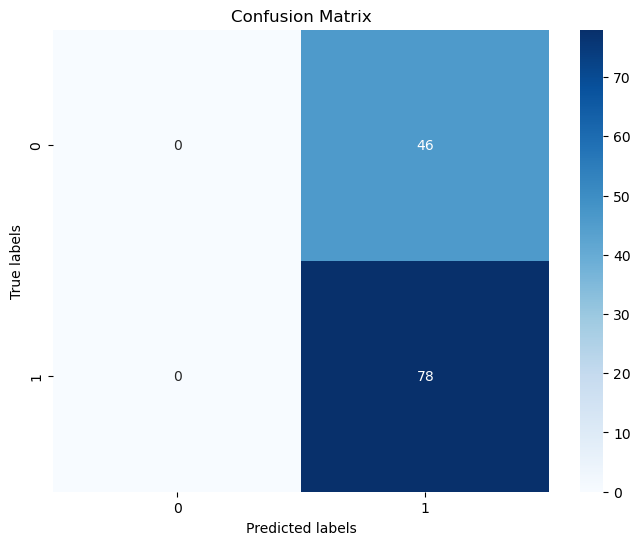

In [ ]:
y_true = test_generatorA.classes
conf_matrix = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
print(classification_report(y_true,y_pred,zero_division=0))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        46
           1       0.63      1.00      0.77        78

    accuracy                           0.63       124
   macro avg       0.31      0.50      0.39       124
weighted avg       0.40      0.63      0.49       124



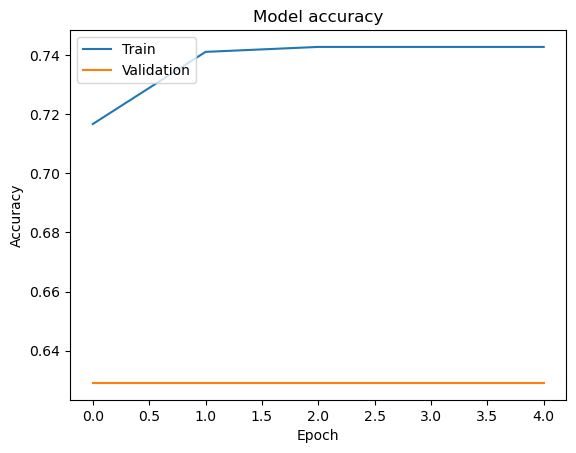

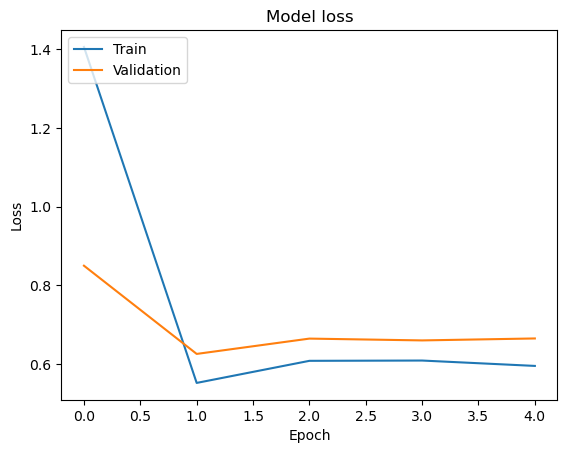

In [ ]:
plt.plot(historyA.history['accuracy'])
plt.plot(historyA.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

plt.plot(historyA.history['loss'])
plt.plot(historyA.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

Dataset B

In [ ]:
test_loss_AB, test_accuracy_AB = modelAB.evaluate(test_generatorB)
print("Test Accuracy:", test_accuracy_AB)

27/27 [==============================] - 61s 2s/step - loss: 0.4332 - accuracy: 0.8333
Test Accuracy: 0.8333333134651184


In [ ]:
y_pred = np.argmax(modelAB.predict(test_generatorB), axis=-1)
classes = dict(zip(test_generatorB.class_indices.values(), test_generatorB.class_indices.keys()))
Predictions = pd.DataFrame({"Test Labels" : test_generatorB.labels,
                            "Test Classes" : [classes[i] for i in test_generatorB.labels],
                            "Prediction Labels" : y_pred,
                            "Prediction Classes" : [classes[i] for i in y_pred],
                            "Path": test_generatorB.filenames,
                            "Prediction Probability" : [x for x in np.asarray(tf.reduce_max(modelAB.predict(test_generatorB), axis = 1))]})
Predictions.sample(10)

27/27 [==============================] - 60s 2s/step


,Test Labels,Test Classes,Prediction Labels,Prediction Classes,Path,Prediction Probability
310,0,Normal,0,Normal,Normal\Normal-1278.png,0.056473
287,0,Normal,0,Normal,Normal\Normal-1257.png,0.100957
27,0,Normal,0,Normal,Normal\Normal-1022.png,0.055033
793,1,Tuberculosis,0,Normal,Tuberculosis\Tuberculosis-183.png,0.015825
79,0,Normal,0,Normal,Normal\Normal-107.png,0.054808
534,0,Normal,0,Normal,Normal\Normal-148.png,0.045021
467,0,Normal,0,Normal,Normal\Normal-1419.png,0.154348
644,0,Normal,0,Normal,Normal\Normal-1579.png,0.044985
559,0,Normal,0,Normal,Normal\Normal-1501.png,0.055850
42,0,Normal,0,Normal,Normal\Normal-1036.png,0.042471


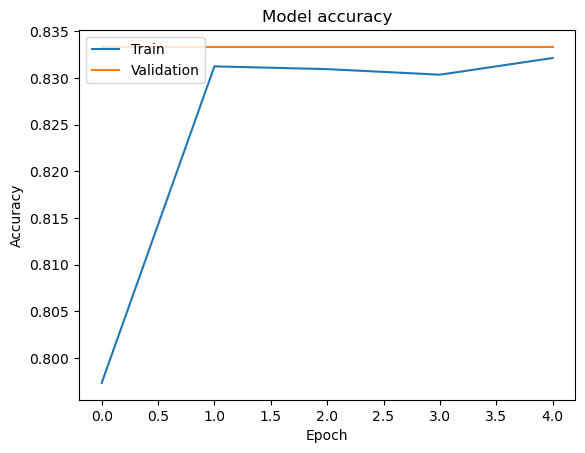

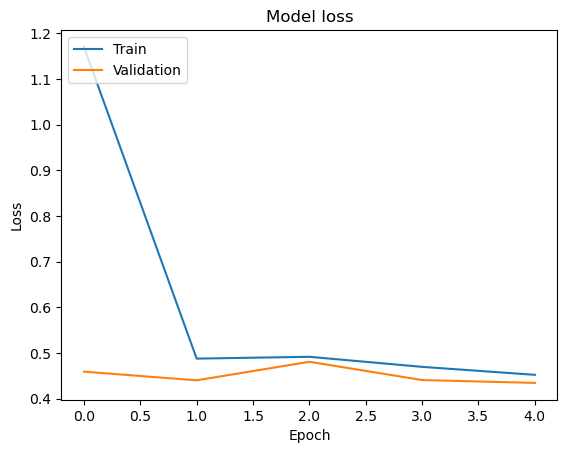

In [ ]:
plt.plot(historyAB.history['accuracy'])
plt.plot(historyAB.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

plt.plot(historyAB.history['loss'])
plt.plot(historyAB.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

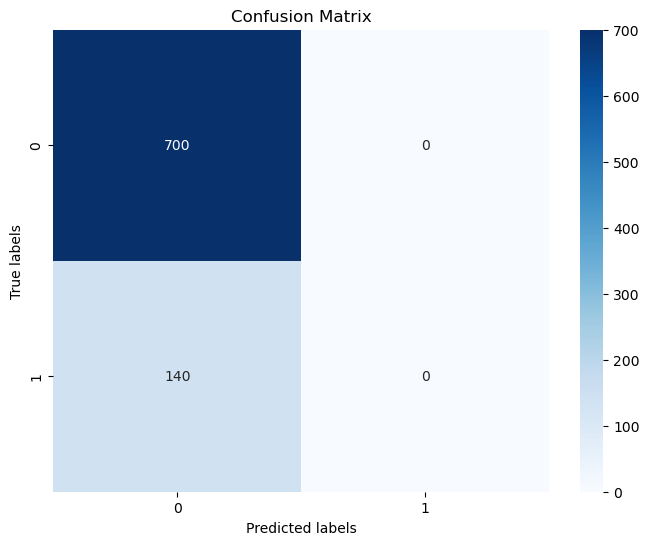

In [ ]:
y_true = test_generatorB.classes
conf_matrix = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
print(classification_report(y_true,y_pred,zero_division=0))

              precision    recall  f1-score   support

           0       0.83      1.00      0.91       700
           1       0.00      0.00      0.00       140

    accuracy                           0.83       840
   macro avg       0.42      0.50      0.45       840
weighted avg       0.69      0.83      0.76       840



Custom CNN

Dataset A

In [ ]:
test_loss_B, test_accuracy_B = modelB.evaluate(test_generatorA)
print("Test Accuracy:", test_accuracy_B)

4/4 [==============================] - 4s 1s/step - loss: 0.6051 - accuracy: 0.6935
Test Accuracy: 0.6935483813285828


In [ ]:
y_pred = np.argmax(modelB.predict(test_generatorA), axis=-1)
classes = dict(zip(test_generatorA.class_indices.values(), test_generatorA.class_indices.keys()))
Predictions = pd.DataFrame({"Test Labels" : test_generatorA.labels,
                            "Test Classes" : [classes[i] for i in test_generatorA.labels],
                            "Prediction Labels" : y_pred,
                            "Prediction Classes" : [classes[i] for i in y_pred],
                            "Path": test_generatorA.filenames,
                            "Prediction Probability" : [x for x in np.asarray(tf.reduce_max(modelB.predict(test_generatorA), axis = 1))]})
Predictions.sample(10)

4/4 [==============================] - 4s 1s/step


,Test Labels,Test Classes,Prediction Labels,Prediction Classes,Path,Prediction Probability
70,1,PNEUMONIA,1,PNEUMONIA,PNEUMONIA\person109_bacteria_519.jpeg,0.957941
81,1,PNEUMONIA,0,NORMAL,PNEUMONIA\person111_bacteria_536.jpeg,0.993405
37,0,NORMAL,1,PNEUMONIA,NORMAL\IM-0059-0001.jpeg,0.528094
95,1,PNEUMONIA,1,PNEUMONIA,PNEUMONIA\person118_bacteria_559.jpeg,0.787852
97,1,PNEUMONIA,1,PNEUMONIA,PNEUMONIA\person119_bacteria_565.jpeg,0.668352
106,1,PNEUMONIA,1,PNEUMONIA,PNEUMONIA\person121_bacteria_575.jpeg,0.948469
56,1,PNEUMONIA,1,PNEUMONIA,PNEUMONIA\person101_bacteria_486.jpeg,0.955246
14,0,NORMAL,1,PNEUMONIA,NORMAL\IM-0019-0001.jpeg,0.855662
23,0,NORMAL,1,PNEUMONIA,NORMAL\IM-0031-0001.jpeg,0.980565
93,1,PNEUMONIA,0,NORMAL,PNEUMONIA\person117_bacteria_556.jpeg,0.874501


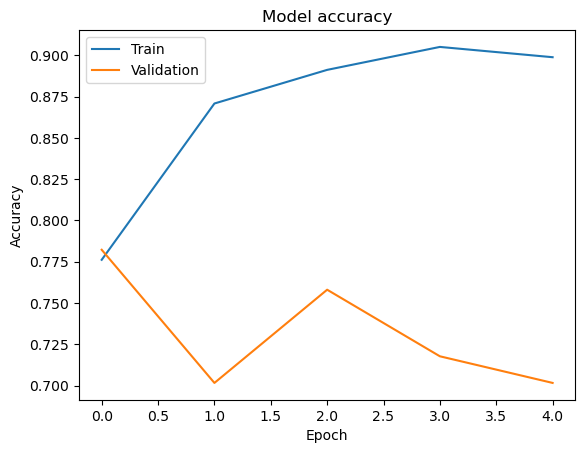

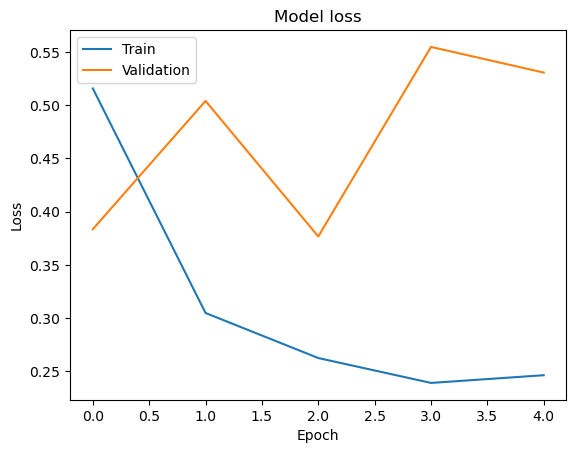

In [ ]:
plt.plot(historyB.history['accuracy'])
plt.plot(historyB.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

plt.plot(historyB.history['loss'])
plt.plot(historyB.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

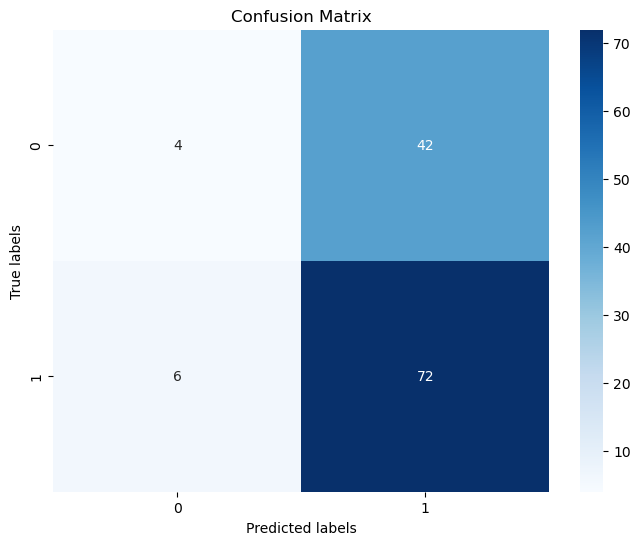

In [ ]:
y_true = test_generatorA.classes
conf_matrix = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
print(classification_report(y_true,y_pred,zero_division=0))

              precision    recall  f1-score   support

           0       0.40      0.09      0.14        46
           1       0.63      0.92      0.75        78

    accuracy                           0.61       124
   macro avg       0.52      0.51      0.45       124
weighted avg       0.55      0.61      0.52       124



Dataset B

In [ ]:
test_loss_BA, test_accuracy_BA = modelBA.evaluate(test_generatorB)
print("Test Accuracy:", test_accuracy_BA)

27/27 [==============================] - 24s 879ms/step - loss: 0.2584 - accuracy: 0.8702
Test Accuracy: 0.8702380657196045


In [ ]:
y_pred = np.argmax(modelBA.predict(test_generatorB), axis=-1)
classes = dict(zip(test_generatorB.class_indices.values(), test_generatorB.class_indices.keys()))
Predictions = pd.DataFrame({"Test Labels" : test_generatorB.labels,
                            "Test Classes" : [classes[i] for i in test_generatorB.labels],
                            "Prediction Labels" : y_pred,
                            "Prediction Classes" : [classes[i] for i in y_pred],
                            "Path": test_generatorB.filenames,
                            "Prediction Probability" : [x for x in np.asarray(tf.reduce_max(modelBA.predict(test_generatorB), axis = 1))]})
Predictions.sample(10)

27/27 [==============================] - 26s 975ms/step


,Test Labels,Test Classes,Prediction Labels,Prediction Classes,Path,Prediction Probability
328,0,Normal,0,Normal,Normal\Normal-1294.png,0.536135
351,0,Normal,0,Normal,Normal\Normal-1314.png,0.825049
8,0,Normal,0,Normal,Normal\Normal-1005.png,0.904368
346,0,Normal,0,Normal,Normal\Normal-131.png,0.635883
573,0,Normal,0,Normal,Normal\Normal-1514.png,0.997708
551,0,Normal,0,Normal,Normal\Normal-1495.png,0.920578
749,1,Tuberculosis,0,Normal,Tuberculosis\Tuberculosis-143.png,0.640491
390,0,Normal,0,Normal,Normal\Normal-135.png,0.910759
330,0,Normal,0,Normal,Normal\Normal-1296.png,0.767749
689,0,Normal,0,Normal,Normal\Normal-1619.png,0.804957


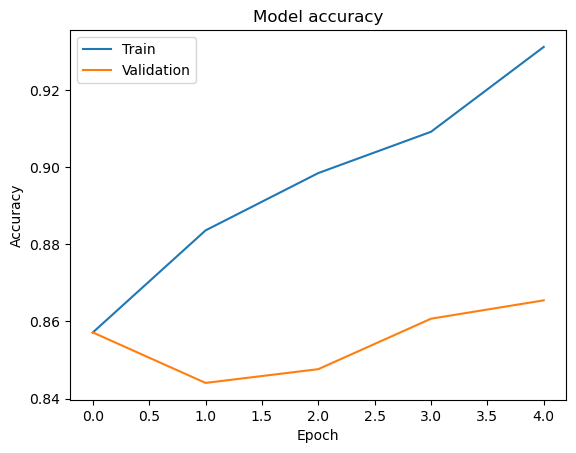

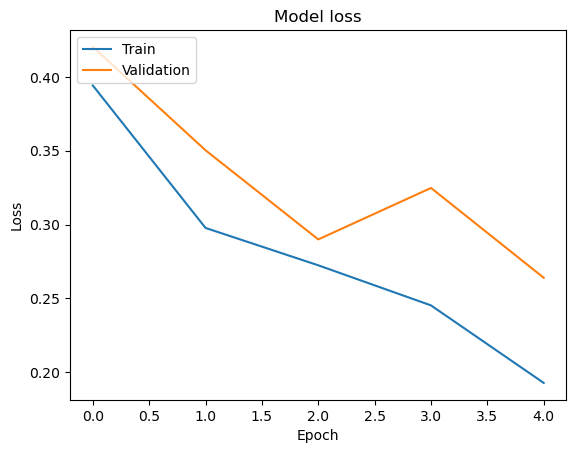

In [ ]:
plt.plot(historyBA.history['accuracy'])
plt.plot(historyBA.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

plt.plot(historyBA.history['loss'])
plt.plot(historyBA.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

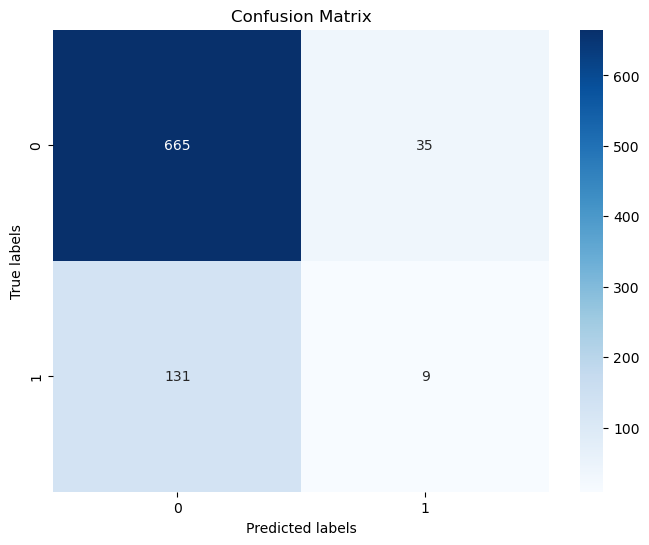

In [ ]:
y_true = test_generatorB.classes
conf_matrix = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
print(classification_report(y_true,y_pred,zero_division=0))

              precision    recall  f1-score   support

           0       0.84      0.95      0.89       700
           1       0.20      0.06      0.10       140

    accuracy                           0.80       840
   macro avg       0.52      0.51      0.49       840
weighted avg       0.73      0.80      0.76       840



# 5.Comparison
Analyze and compare the performances of ResNet and the custom CNN on both Dataset A and
Dataset B. Assess their accuracies in detecting various thoracic conditions, considering the
impact of incorporating batch normalization and dropout layers. Explore differences in
classification accuracy and error patterns between the models.

Dataset A

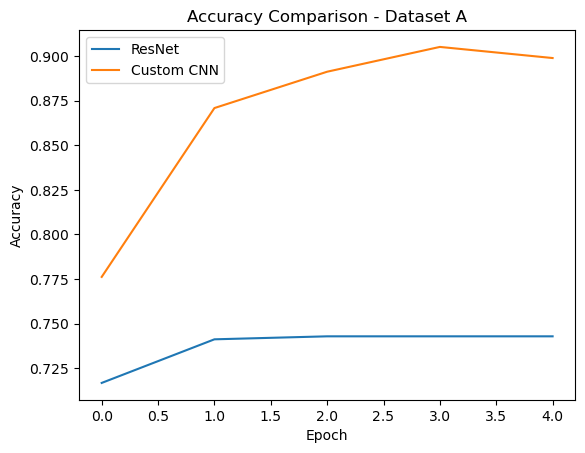

In [ ]:
plt.plot(historyA.history['accuracy'])
plt.plot(historyB.history['accuracy'])
plt.title('Accuracy Comparison - Dataset A')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['ResNet', 'Custom CNN'], loc='upper left')
plt.show()

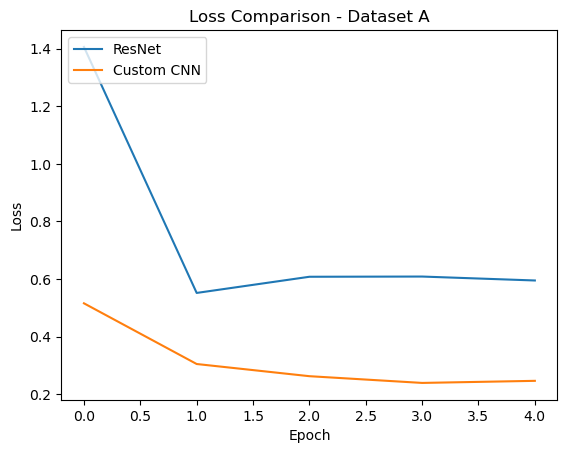

In [ ]:
plt.plot(historyA.history['loss'])
plt.plot(historyB.history['loss'])
plt.title('Loss Comparison - Dataset A')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['ResNet', 'Custom CNN'], loc='upper left')
plt.show()

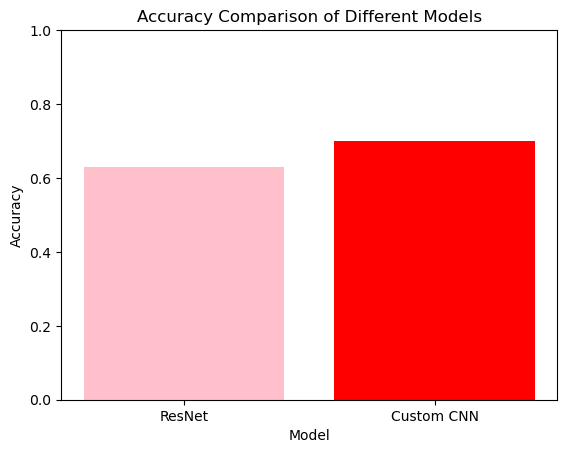

In [ ]:
accuracies = {'ResNet': 0.63,'Custom CNN': 0.7}

# Plot accuracies
bars = plt.bar(accuracies.keys(), accuracies.values(), color=['Pink', 'Red'])
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.title('Accuracy Comparison of Different Models')
plt.ylim(0, 1)
plt.show()

Dataset B

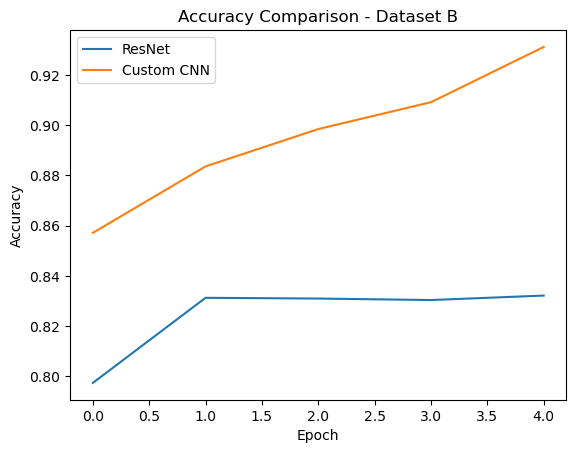

In [ ]:
plt.plot(historyAB.history['accuracy'])
plt.plot(historyBA.history['accuracy'])
plt.title('Accuracy Comparison - Dataset B')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['ResNet', 'Custom CNN'], loc='upper left')
plt.show()

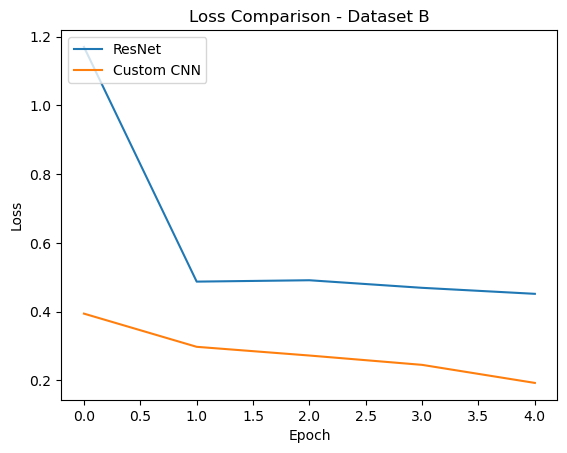

In [ ]:
plt.plot(historyAB.history['loss'])
plt.plot(historyBA.history['loss'])
plt.title('Loss Comparison - Dataset B')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['ResNet', 'Custom CNN'], loc='upper left')
plt.show()

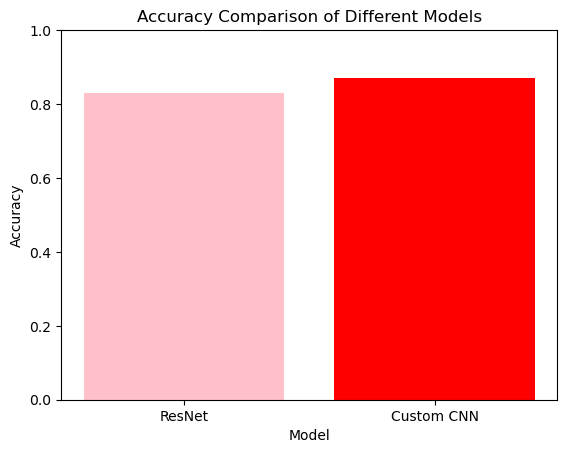

In [ ]:
accuracies = {'ResNet': 0.83,'Custom CNN': 0.87}

# Plot accuracies
bars = plt.bar(accuracies.keys(), accuracies.values(), color=['Pink', 'Red'])
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.title('Accuracy Comparison of Different Models')
plt.ylim(0, 1)
plt.show()